In [36]:
import pandas as pd
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

from sklearn.inspection import plot_partial_dependence
from pycebox.ice import ice, ice_plot
from alepython import ale_plot

from sklearn.linear_model import LogisticRegression
import lime
import lime.lime_tabular
from sklearn.neighbors import KNeighborsClassifier

# DATA
* V1: Recency - months since last donation
* V2: Frequency - total number of donation
* V3: Monetary - total blood donated in c.c.
* V4: Time - months since first donation), and a binary variable representing whether he/she donated blood in March 2007 (1 stand for donating blood; 0 stands for not donating blood).
* Class - The target attribute is a binary variable representing whether he/she donated blood in March 2007 (2 stands for donating blood; 1 stands for not donating blood).


# PREPROCESSING

In [4]:
# read csv
data = pd.read_csv('blood.csv', names=["recency","frequency","monetary","time","Class"], header=0)

# scale numeric values
scaler = preprocessing.MinMaxScaler()
data[['recency', 'frequency', 'monetary', 'time']] = scaler.fit_transform(data[['recency', 'frequency', 'monetary', 'time']])

# adjust Class
data['Class'] = data['Class'] - 1

# splitting
temp_x, f2_x, temp_y, f2_y = train_test_split(data[['recency', 'frequency', 'monetary', 'time']], data['Class'], test_size=0.33, random_state=42)
f1_x, f3_x, f1_y, f3_y = train_test_split(temp_x, temp_y, test_size=0.5, random_state=42)
X = [f1_x, f2_x, f3_x]
Y = [f1_y, f2_y, f3_y]

# METHODS

In [5]:
def make_tree(x,y,test_x):
    dtree = DecisionTreeClassifier(random_state=42)
    dtree.fit(x,y)
    prediction = dtree.predict(test_x)
    return dtree, prediction

In [47]:
def make_svm(x,y,test_x):
    svm = SVC(random_state=42, probability=True)
    svm.fit(x,y)
    prediction = svm.predict(test_x)
    return svm, prediction

In [6]:
def pcp_do(dtree, x_train, y_train, x_test):
    for a in range(len(x_train.columns)):
        plot_partial_dependence(dtree, x_test, [a])

In [7]:
def ice_do(dtree, x_train, y_train, x_test):
    for a in (x_train.columns):
        ice_df = ice(x_test, a, dtree.predict, num_grid_points=100)
        ice_plot(ice_df)

In [8]:
def ale_do(dtree, x_train, y_train, x_test):
    for a in (x_train.columns):
        ale_plot(dtree, x_test, a)

In [19]:
def surrogate_do(dtree, x_train, y_train, x_test, y_test, prediction, hist=False):
    # TODO scores for comparison
    # substitute class column
    lreg = LogisticRegression()
    lreg.fit(x_test, prediction)
    
    # TODO print histograms without overlap?
    if hist:
        for a in x_train.columns:
            x_test[a].hist()
        
    return lreg.intercept_, lreg.coef_

In [24]:
def lime_do(dtree, x_test, sample=10):
    explainer = lime.lime_tabular.LimeTabularExplainer(x_test.to_numpy())
    exp = explainer.explain_instance(x_test.iloc[sample], dtree.predict_proba, num_features=4)
    exp.show_in_notebook(show_table=True, show_all=False)

In [30]:
def counterfactuals_do(x_test, prediction, top_k=3, sample=10):
    knn = KNeighborsClassifier()
    knn.fit(x_test, prediction)
    dist, neighbors_idx = knn.kneighbors([x_test.iloc[sample]], n_neighbors=len(x_test))    
    candidates = pd.concat([x_test.iloc[neighbors_idx[0]].reset_index(drop=True), pd.DataFrame(prediction[neighbors_idx[0]])], axis=1, ignore_index=True)
    return candidates[candidates[4] != prediction[sample]].head(top_k), x_test.iloc[sample]

# GENERATE CV FOLDS

In [35]:
# generate splits
f1_x_train = pd.concat([X[1], X[2]])
f1_y_train = pd.concat([Y[1], Y[2]])
f1_x_test = X[0]
f1_y_test = Y[0]
f2_x_train = pd.concat([X[0], X[2]])
f2_y_train = pd.concat([Y[0], Y[2]])
f2_x_test = X[1]
f2_y_test = Y[1]
f3_x_train = pd.concat([X[0], X[1]])
f3_y_train = pd.concat([Y[0], Y[1]])
f3_x_test = X[2]
f3_y_test = Y[2]

# CALCULATE DTREE PREDICTIONS

In [34]:
# make trees, generate predictions
f1_dtree, f1_prediction = make_tree(f1_x_train, f1_y_train, f1_x_test)
f2_dtree, f2_prediction = make_tree(f2_x_train, f2_y_train, f2_x_test)
f3_dtree, f3_prediction = make_tree(f3_x_train, f3_y_train, f3_x_test)

# FOLD 1

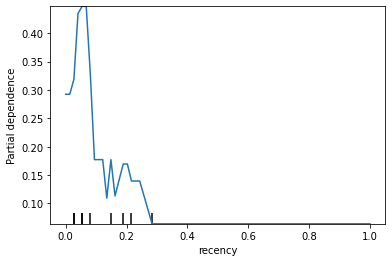

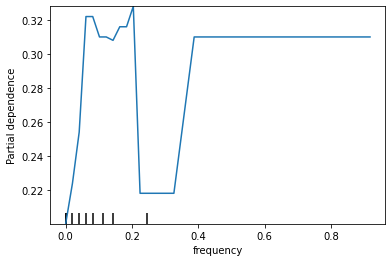

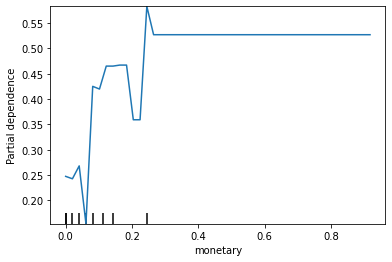

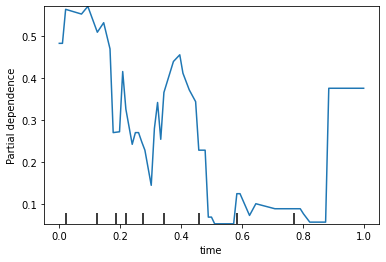

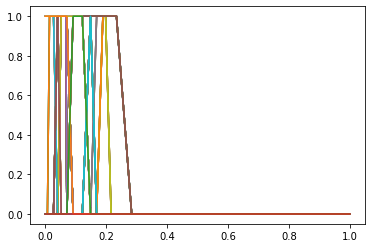

...

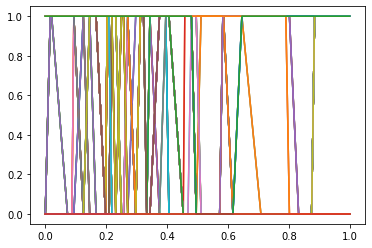

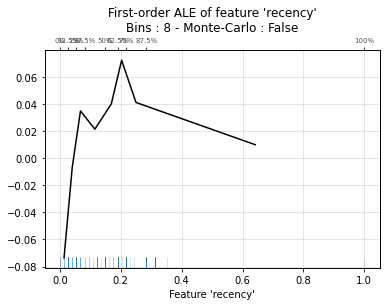

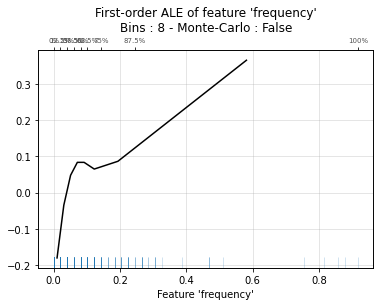

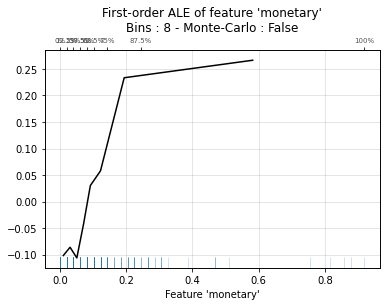

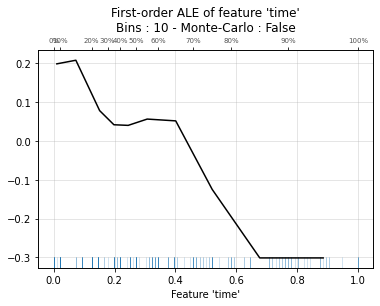

In [11]:
pcp_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)
ice_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)
ale_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test)

In [42]:
surrogate_do(f1_dtree, f1_x_train, f1_y_train, f1_x_test, f1_y_test, f1_prediction)
lime_do(f1_dtree, f1_x_test)
counterfactuals_do(f1_x_test, f1_prediction)

(           0         1         2         3  4
 65  0.054054  0.224490  0.224490  0.333333  1
 73  0.054054  0.265306  0.265306  0.395833  1
 82  0.054054  0.183673  0.183673  0.270833  1,
 recency      0.189189
 frequency    0.142857
 monetary     0.142857
 time         0.458333
 Name: 649, dtype: float64)

# FOLD 2

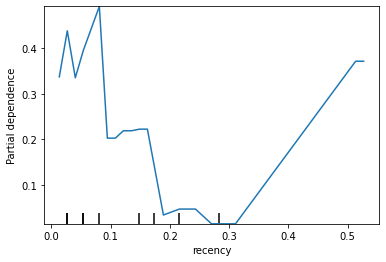

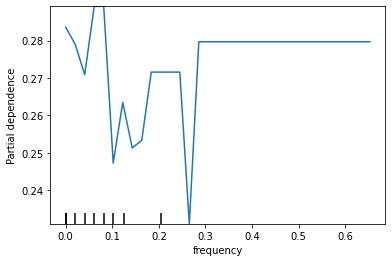

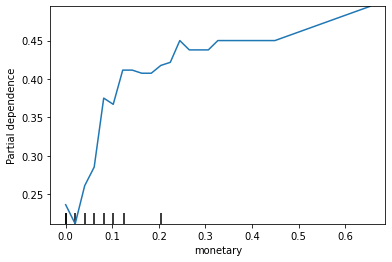

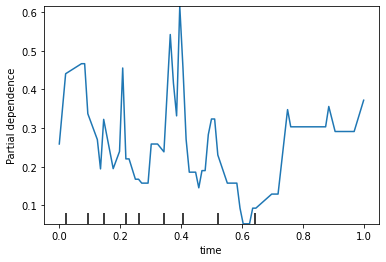

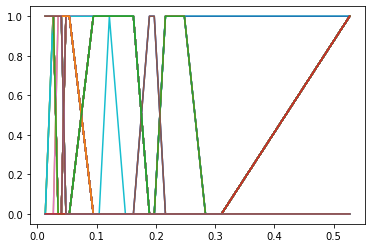

...

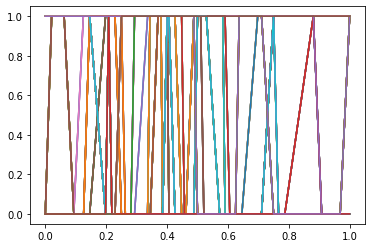

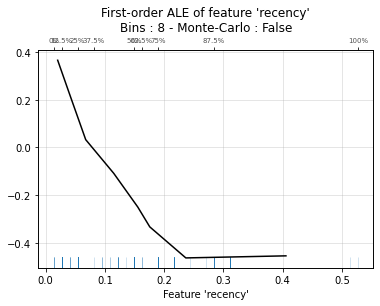

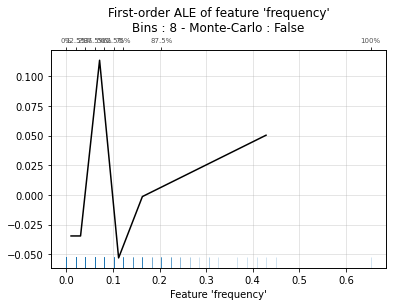

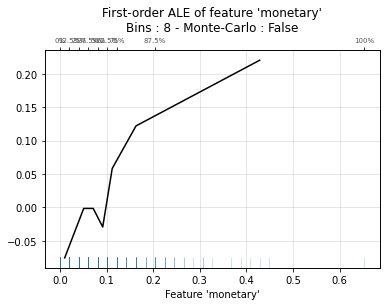

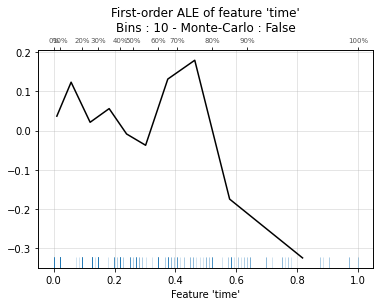

In [12]:
pcp_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)
ice_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)
ale_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test)

In [43]:
surrogate_do(f2_dtree, f2_x_train, f2_y_train, f2_x_test, f2_y_test, f2_prediction)
lime_do(f2_dtree, f2_x_test)
counterfactuals_do(f2_x_test, f2_prediction)

(           0         1         2         3  4
 8   0.013514  0.224490  0.224490  0.343750  1
 16  0.027027  0.204082  0.204082  0.270833  1
 24  0.027027  0.204082  0.204082  0.250000  1,
 recency      0.054054
 frequency    0.163265
 monetary     0.163265
 time         0.375000
 Name: 97, dtype: float64)

# FOLD 3

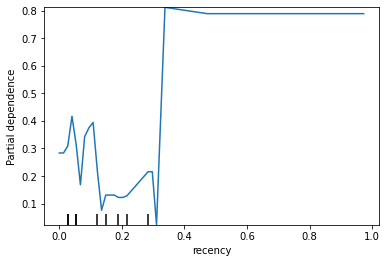

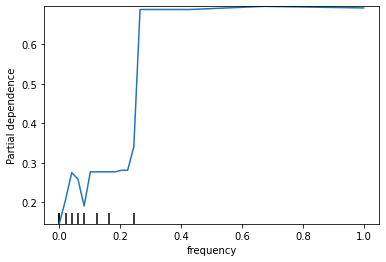

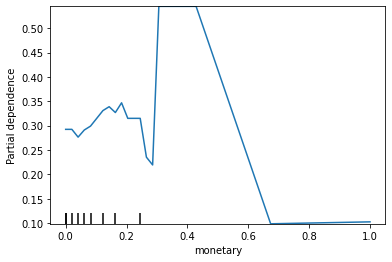

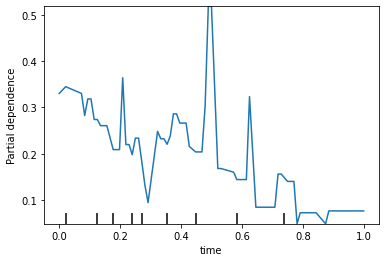

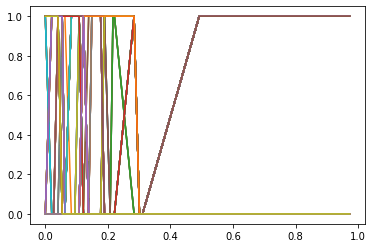

...

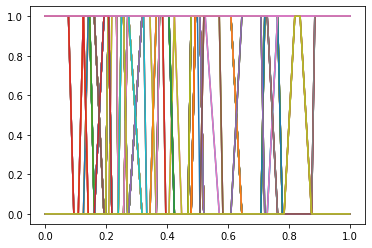

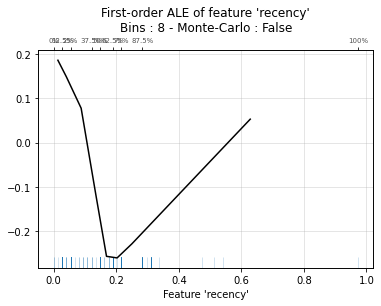

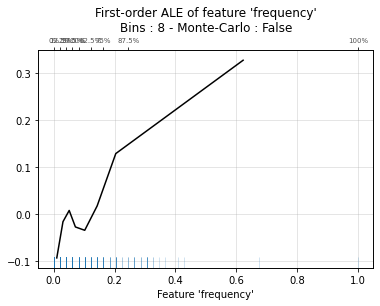

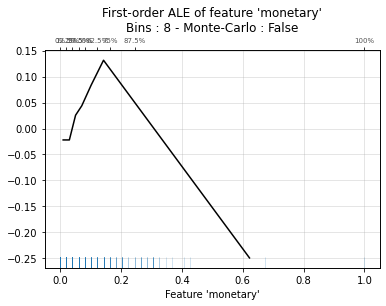

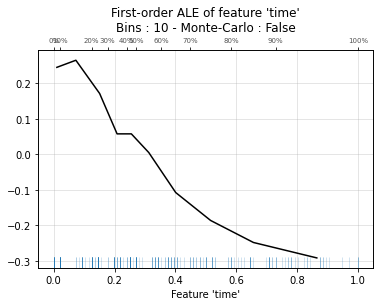

In [13]:
pcp_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)
ice_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)
ale_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test)

In [44]:
surrogate_do(f3_dtree, f3_x_train, f3_y_train, f3_x_test, f3_y_test, f3_prediction)
lime_do(f3_dtree, f3_x_test)
counterfactuals_do(f3_x_test, f3_prediction)

(            0         1         2         3  4
 155  0.000000  0.244898  0.244898  0.270833  1
 187  0.054054  0.306122  0.306122  0.375000  1
 218  0.027027  0.408163  0.408163  0.520833  1,
 recency      0.027027
 frequency    0.000000
 monetary     0.000000
 time         0.000000
 Name: 587, dtype: float64)

# CALCULATE SVM PREDICTIONS

In [48]:
# make trees, generate predictions
f1_svm, f1_prediction = make_svm(f1_x_train, f1_y_train, f1_x_test)
f2_svm, f2_prediction = make_svm(f2_x_train, f2_y_train, f2_x_test)
f3_svm, f3_prediction = make_svm(f3_x_train, f3_y_train, f3_x_test)

# FOLD 1

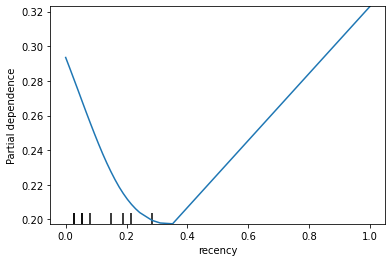

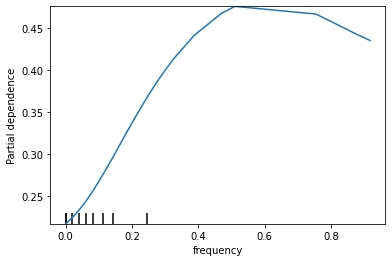

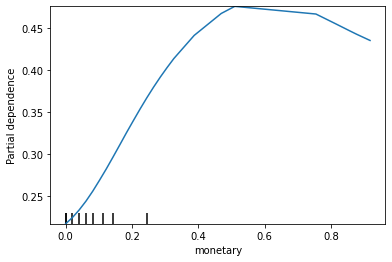

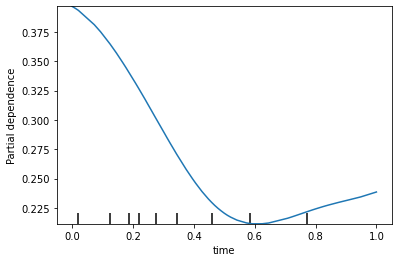

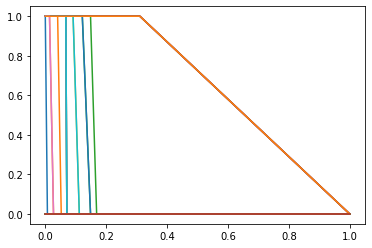

...

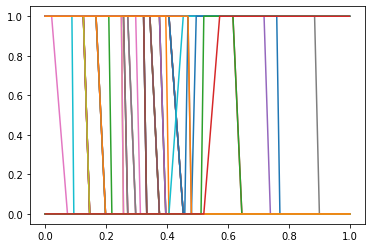

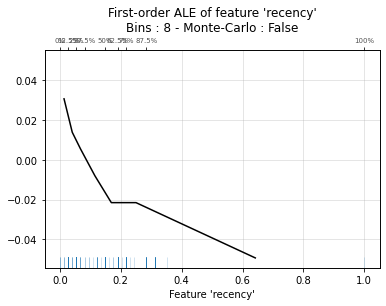

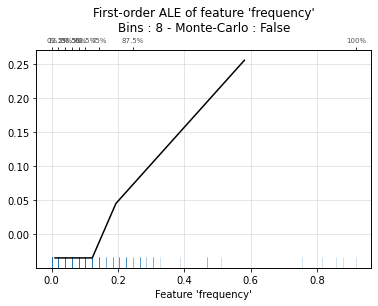

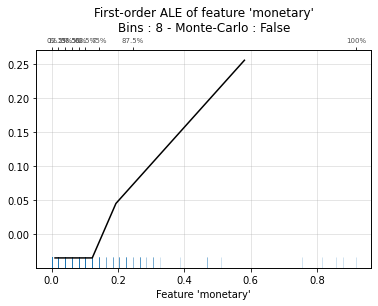

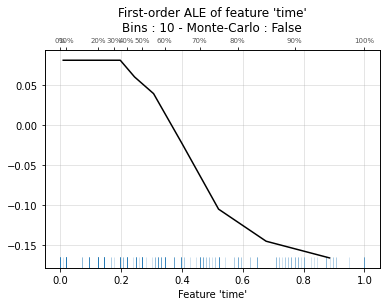

In [49]:
pcp_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)
ice_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)
ale_do(f1_svm, f1_x_train, f1_y_train, f1_x_test)

In [50]:
surrogate_do(f1_svm, f1_x_train, f1_y_train, f1_x_test, f1_y_test, f1_prediction)
lime_do(f1_svm, f1_x_test)
counterfactuals_do(f1_x_test, f1_prediction)

(           0         1         2         3  4
 65  0.054054  0.224490  0.224490  0.333333  1
 73  0.054054  0.265306  0.265306  0.395833  1
 82  0.054054  0.183673  0.183673  0.270833  1,
 recency      0.189189
 frequency    0.142857
 monetary     0.142857
 time         0.458333
 Name: 649, dtype: float64)

# FOLD 2

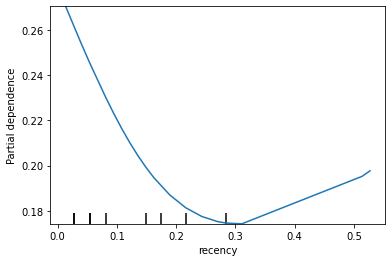

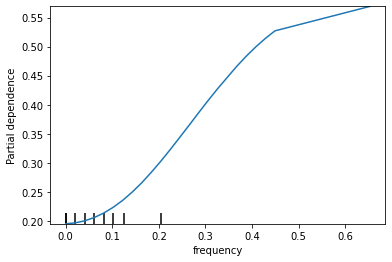

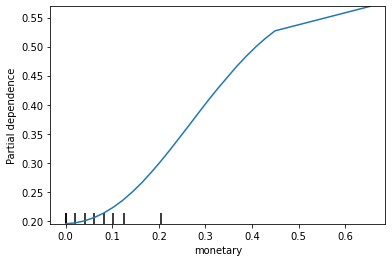

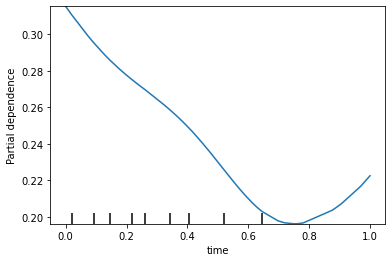

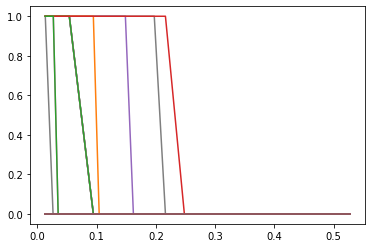

...

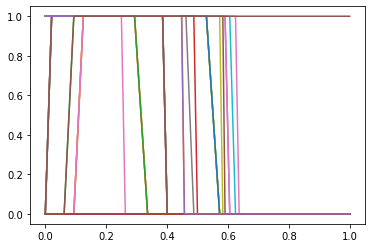

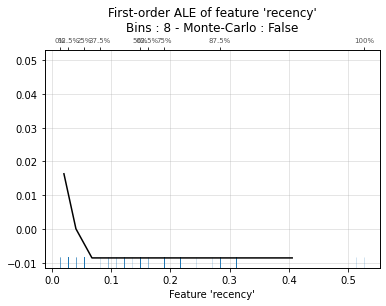

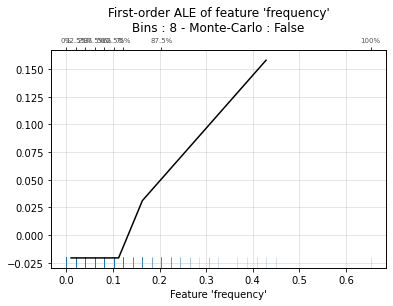

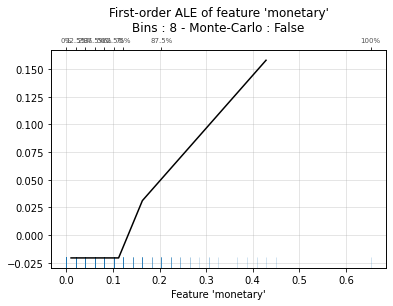

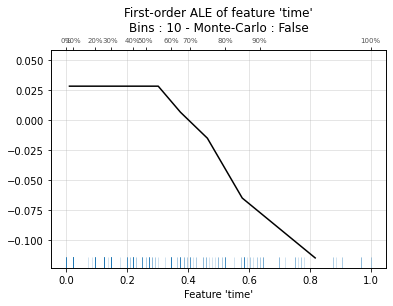

In [52]:
pcp_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)
ice_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)
ale_do(f2_svm, f2_x_train, f2_y_train, f2_x_test)

In [53]:
surrogate_do(f2_svm, f2_x_train, f2_y_train, f2_x_test, f2_y_test, f2_prediction)
lime_do(f2_svm, f2_x_test)
counterfactuals_do(f2_x_test, f2_prediction)

(           0         1         2         3  4
 8   0.013514  0.224490  0.224490  0.343750  1
 16  0.027027  0.204082  0.204082  0.270833  1
 24  0.027027  0.204082  0.204082  0.250000  1,
 recency      0.054054
 frequency    0.163265
 monetary     0.163265
 time         0.375000
 Name: 97, dtype: float64)

# FOLD 3

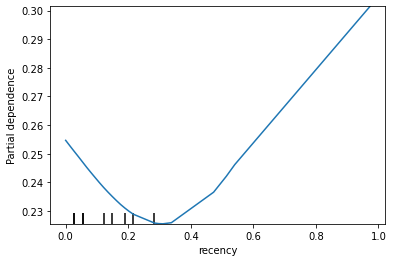

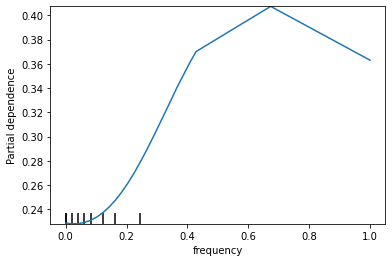

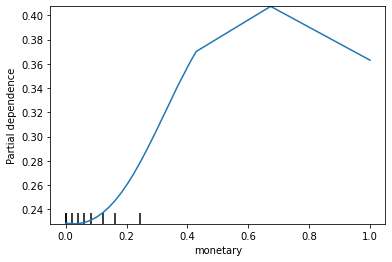

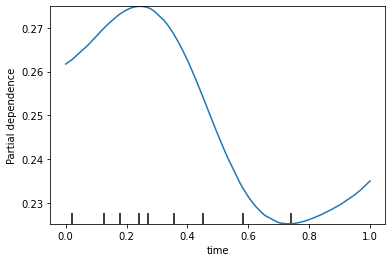

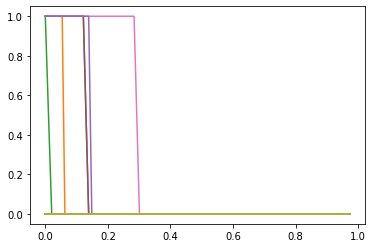

...

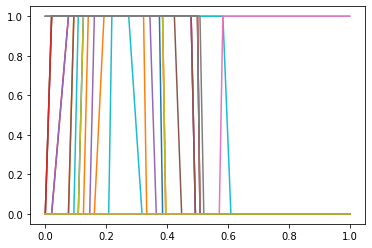

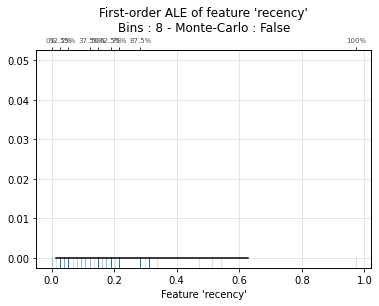

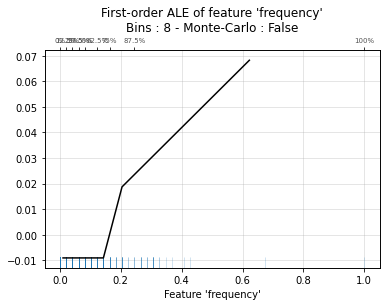

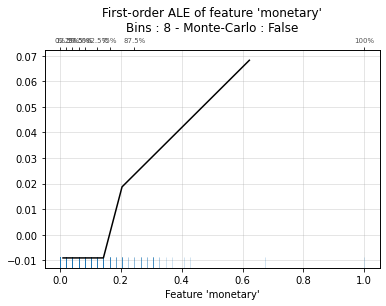

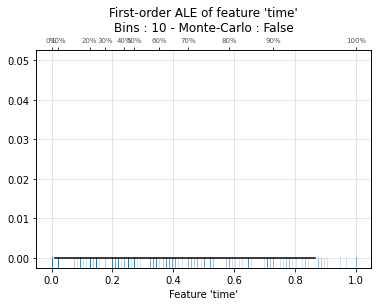

In [54]:
pcp_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)
ice_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)
ale_do(f3_svm, f3_x_train, f3_y_train, f3_x_test)

In [55]:
surrogate_do(f3_svm, f3_x_train, f3_y_train, f3_x_test, f3_y_test, f3_prediction)
lime_do(f3_svm, f3_x_test)
counterfactuals_do(f3_x_test, f3_prediction)

(            0         1         2         3  4
 155  0.000000  0.244898  0.244898  0.270833  1
 187  0.054054  0.306122  0.306122  0.375000  1
 218  0.027027  0.408163  0.408163  0.520833  1,
 recency      0.027027
 frequency    0.000000
 monetary     0.000000
 time         0.000000
 Name: 587, dtype: float64)